We've seen that the `lm()` function in `R` provides a wealth of information about our linear models, but the output is cumbersome to work with:

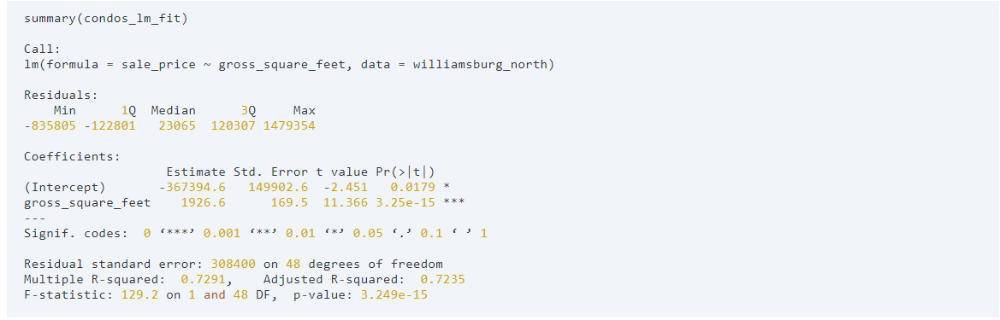

Summary statistics and error metrics can be extracted from the model object output with indexing or helper functions like `coefficients()`, but this interrupts our workflow. What if we need to develop numerous linear models, and compare their results? And what if, for example, we want to perform linear regressions of `sale_price` on the basis of `gross_square_feet` for condominiums in each Brooklyn neighborhood individually? Let's learn how to do this with powerful [tidyverse](https://www.tidyverse.org/) tools!

In this file we will learn how to scale-up our linear regression modeling skills by fitting many linear models at once using tidyverse tools. The `lm()` output is definitely not tidy! Fortunately the [`broom` package](https://broom.tidymodels.org/) in R was developed to make working with many tidy models possible.

As discussed, the `lm()` output is not [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The `broom` package takes the messy output of built-in modeling functions in `R`, such as `lm()` and returns a tidy dataframe. With the data in a tidy format we are able to leverage the tidyverse tools that we know, and some tidyverse tools that we don't yet know to build and compare many linear models

The `broom` package tidies the outputs of more than one hundred models, so the knowledge gained in this file applies broadly to modeling in `R`, not just to `lm()` output. The `broom` package includes three functions, which are:

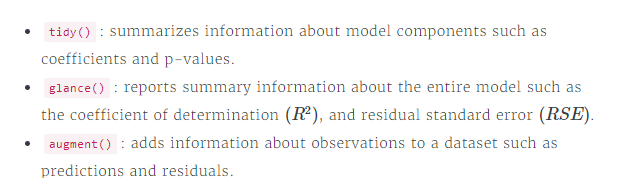

These functions are detailed in [this vignette](https://cran.r-project.org/web/packages/broom/vignettes/broom.html). The `broom` package works well with tidyverse tools, namely with functions from the `dplyr`, `tidyr` and `purrr` packages. 

In fact, `broom` becomes a much more powerful analysis tool because of its compatibility with tidyverse tools as described in [this vignette](https://cran.r-project.org/web/packages/broom/vignettes/broom_and_dplyr.html).

In this file we will start by exploring a single function from the `broom` package, [`tidy()` function](https://broom.tidymodels.org/), and then we will combine the function with tidyverse tools to generate many linear models.

The `tidy()` function returns the summarized information about the components of a model. The `tidy()` function requires `x`, a model object, as input and includes an optional argument for confidence intervals. In the example below, `lm_fit` refers to any `lm` object created by `lm()`:

`library(broom)
tidy(x = lm_fit)`

The output from `tidy()` is much easier to digest than the standard `lm` object `summary()` output. And because the format is a `tidy` dataframe where each row is an observation and each column is a variable, we can combine this output with other models. In other words, we can stack many model outputs together in a single dataframe.

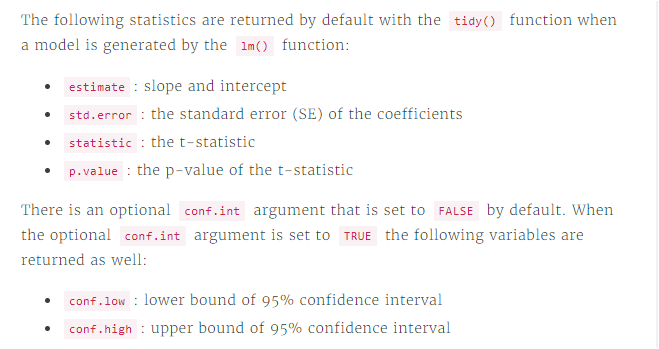

Note that the confidence interval is set to `0.95` or 95% by default, but this can be changed with the optional `conf.level` function argument.

Recall that the `lm()` output is stored as a list. It takes considerable work to convert `lm()` output to a dataframe. We learned that to obtain the information bulleted above, we can view the same information with the `summary()` function:

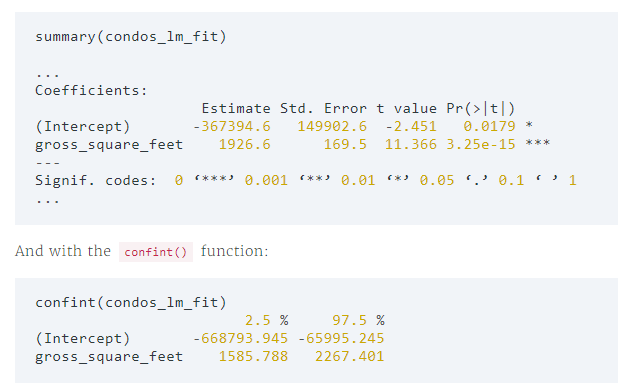

Note we've only included a portion of the `summary()` output! The tidy dataframe returned by the `broom` function `tidy()` contains much of the same information above in a more usable format. For example, here is a look at the tidy dataframe we will generate

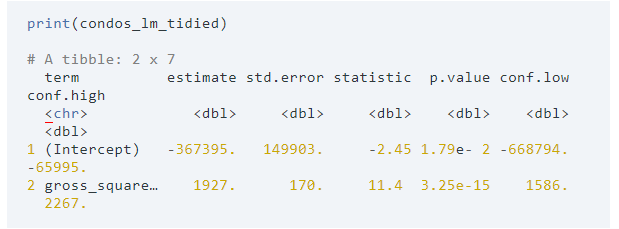

**Task**

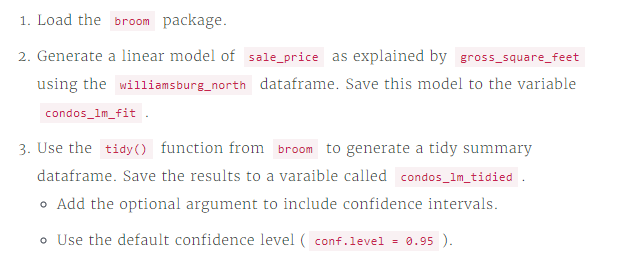

Call the `summary()` function on the linear model object. Take a look at the contents of `lm_tidied` and compare it to the `summary()` output.

**Answer**

`library(readr)`

`williamsburg_north <- suppressMessages(read_csv("williamsburg_north.csv"))`

`library(broom)`

`condos_lm_fit <- lm(sale_price ~ gross_square_feet, data = williamsburg_north)`

`condos_lm_tidied <- tidy(x = condos_lm_fit, conf.int = TRUE)`

Now that we've covered the basics of the `tidy()` function from the `broom` package, we will learn how to combine the functions with tidyverse tools to scale-up the functionality. But first let's take a quick look at the results from our above exercise where we tidied the `williamsburg_north` dataframe with statistics resulting from modeling `sale_price` as explained by `gross_square_feet`. 

When we view the structure of the dataframe, we can see that there is one row for statistics associated with the intercept estimate, and one row for statistics associated with the slope estimate:

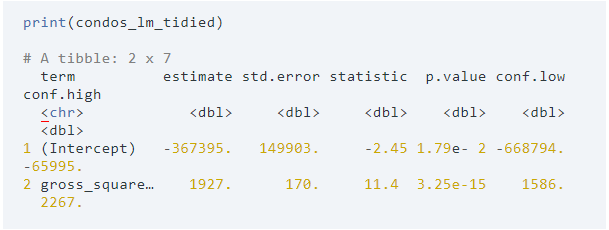

When the goal is to generate many linear models, the `tidy()` process (or `broom::augment()` and `broom::glance()`) can be applied to each model/data combination individually. In the example above, the model is a linear regression of `sale_price` explained by `gross_square_feet` and the data is the `williamsburg_north` dataframe only.

Next we will perform linear regressions of `sale_price` explained by `gross_square_feet` for 10 Brooklyn neighborhoods at once! 

We will work with two datasets. For teaching purposes, we provide examples using a dataset called `williamsburg_condos` that contains all sale records for condominiums in the four Williamsburg neighborhoods. This teaching dataset will allow us to explore the process of generating linear models for the four distinct Williamsburg neighborhoods.

We will use a larger dataset called `brooklyn_top_ten` that contains condominium sale records for the 10 Brooklyn neighborhoods with the highest number of condominium sale records. Here is the code we used to generate the `brooklyn_top_ten` dataframe:

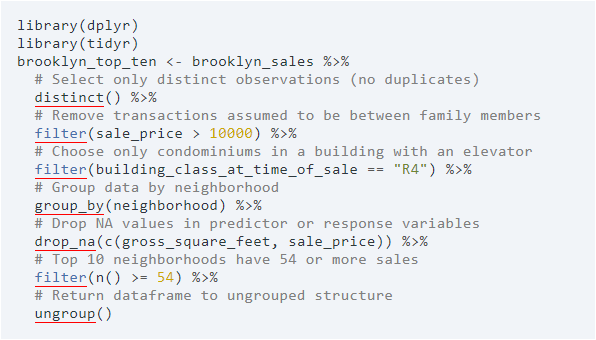

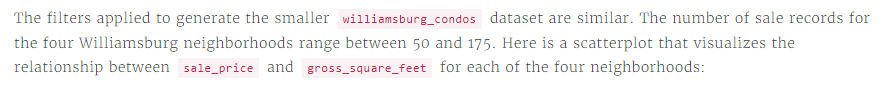

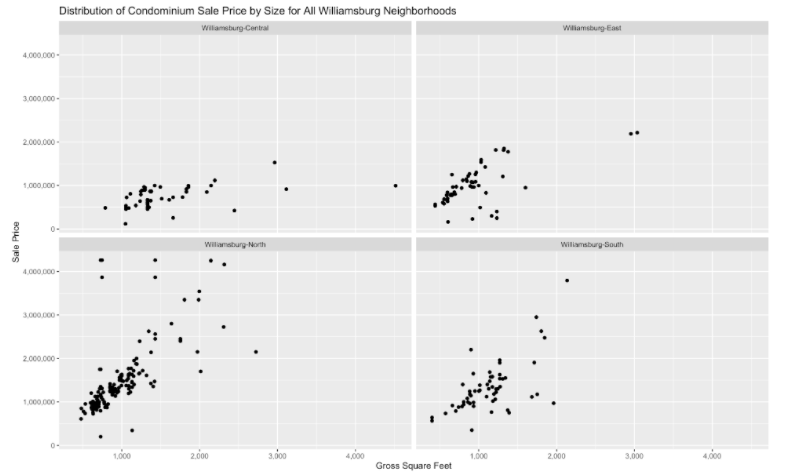

Let's learn how to generate many linear models with `broom`. The `broom` package offers three functions, but to start we will focus our attention on using the `tidy()` function. And more specifically our aim will be to extract the slope estimate, 
**^
β
1**
, for the model we generate for each neighborhood.

The `R` code that we are about to learn is elegant and concise. But to comprehend what is going on requires an understanding of data structures, modeling, and iteration.

The next to learn how to generate many linear models with `broom` is to learn about [nested data](https://tidyr.tidyverse.org/articles/nest.html). Nested data is central to the workflow with `broom`.

As described in [the documentation](https://tidyr.tidyverse.org/reference/nest.html), nesting is performed with the function `nest()` from the tidyverse `tidyr` package. Nesting uses a categorical variable to partition a single dataframe into a "list-column" of many dataframes. What this means is that nesting creates a dataframe that has one row per group, or category (`neighborhood` in our case), and the dataframe contains a special list-column `data` where each observation is itself a dataframe! This animation illustrates the data transformation:



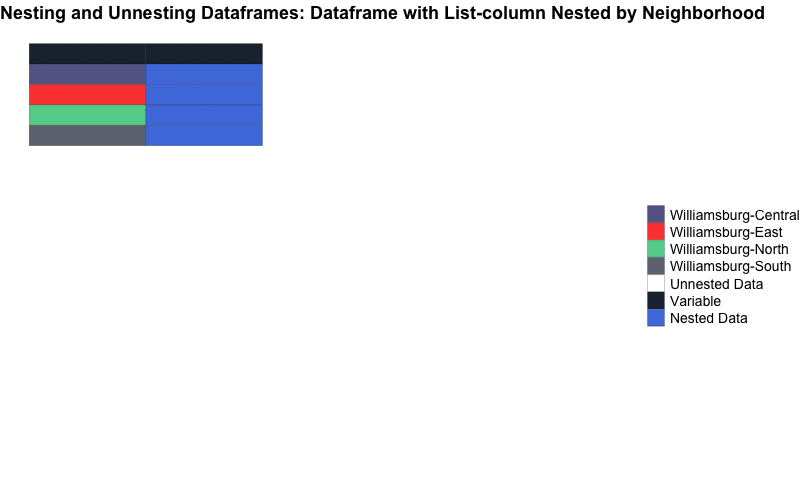

In [1]:
from IPython.display import Image

Image("unnest_animate_neighborhood.gif")

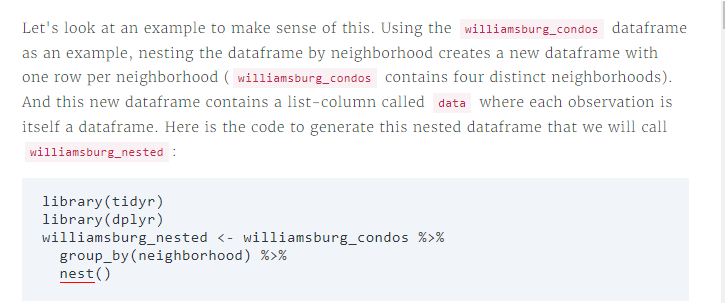

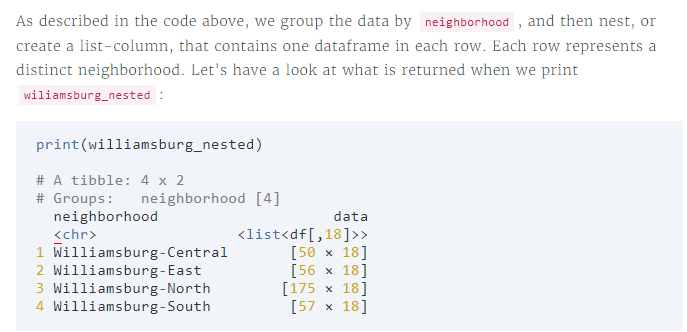

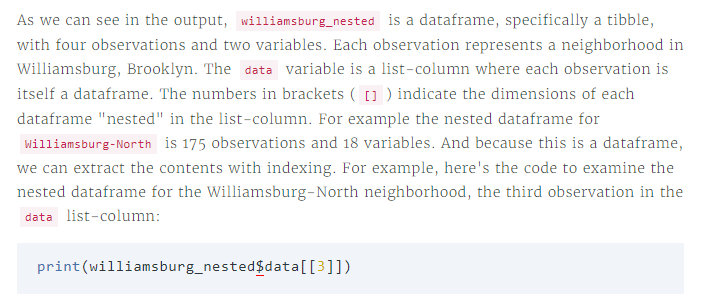

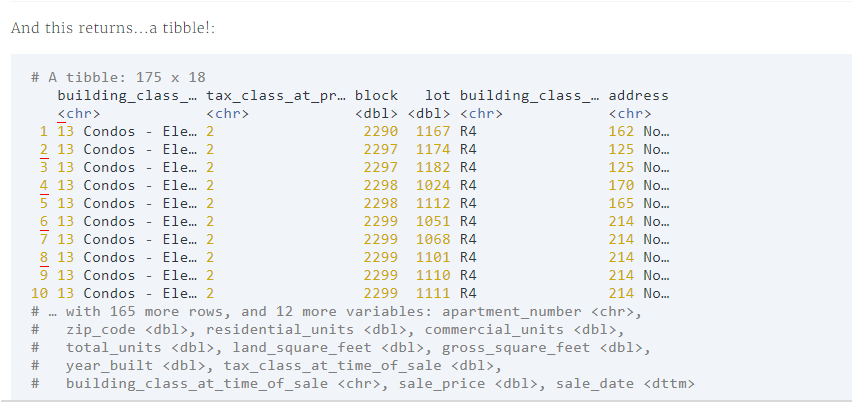

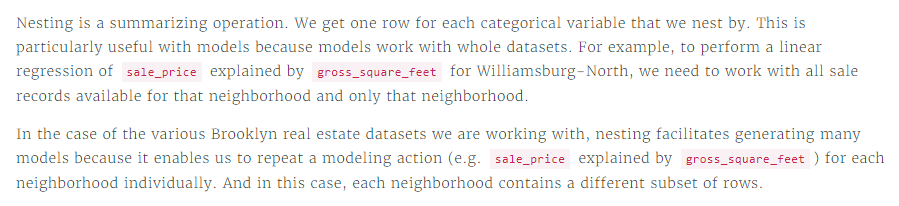

The opposite action unnesting, which is executed with the [`unnest()` function](https://tidyr.tidyverse.org/reference/nest.html) flattens the data back out into regular columns. In other words, unnesting reverses the nesting process. 

**Task**

1. Load the tidyverse packages required to 
    * group and manipulate data, and 
    * to nest data.
2. Nest the `brooklyn_top_ten` dataframe by neighborhood and assign the results to a variable named `brooklyn_nested`.
3. Index by position to extract and determine the neighborhood name of the sixth observation (index position) in the `brooklyn_nested` dataframe. 
4. Extract the nested dataframe in the sixth index position.

**Answer**

`library(tidyr)
library(dplyr)`

`brooklyn_nested <- brooklyn_top_ten %>% 
  group_by(neighborhood) %>% 
  nest()`

`# Return neighborhood name with:`

`# brooklyn_nested$neighborhood[[6]]`


`# Return dataframe for Madison`

`Madison <- brooklyn_nested$data[[6]]`

The next step in the process is to apply a linear regression model to each row in the dataframes we are working with. But first let's reflect on the structure of the `brooklyn_nested` dataframe we generated above. If we print `brooklyn_nested` in `R` Studio, the results look like this:

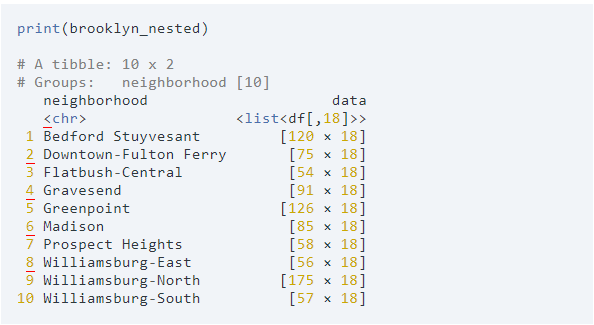

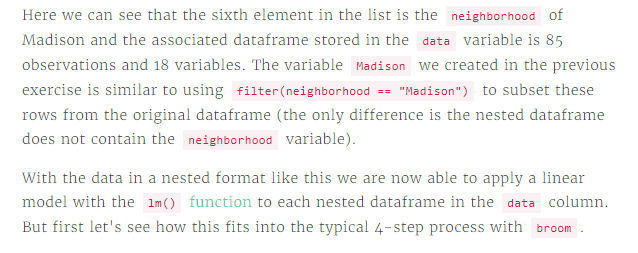

The general workflow using `broom` and `tidyverse` tools to generate many models involves 4 steps:

1. Nest a dataframe by a categorical variable `neighborhood`.
2. Fit models to nested dataframes with the [`map()` function](https://purrr.tidyverse.org/reference/map.html) - we'll do that next!
3. Apply the `broom` function `tidy()`, `augment()`, and/or `glance()` using each nested model - we'll work with `tidy()` first.
4. `unnest()` to a tidy dataframe - this allows us to see the results.

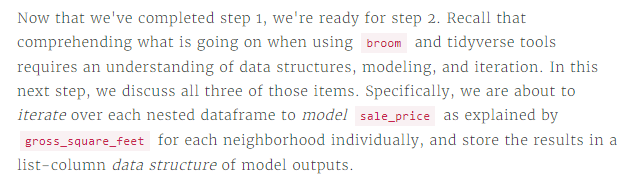

Stated in more familiar terms, we are going to use the `map()` function from `purrr` to iterate over each row in the `data` column and generate a linear model with the `lm()` function. We'll use the [`mutate()` function](https://dplyr.tidyverse.org/reference/mutate.html) from `dplyr` to add a new column called `linear_model` where we store the results of each linear model performed for each neighborhood. Because we are using `mutate()` to add a variable the dataframe we are working with, we can build-on our previous code using the pipe operator (`%>%`) like this:

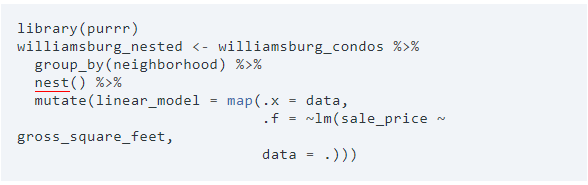

With the `mutate()` call we have added the new column `linear_model` to our dataframe. Recall that the `map()` function takes the following arguments:

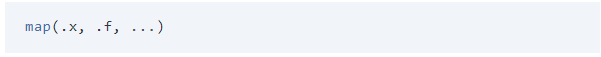

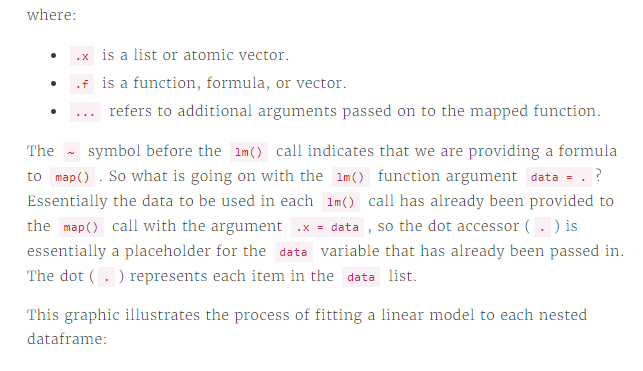

This graphic illustrates the process of fitting a linear model to each nested dataframe:

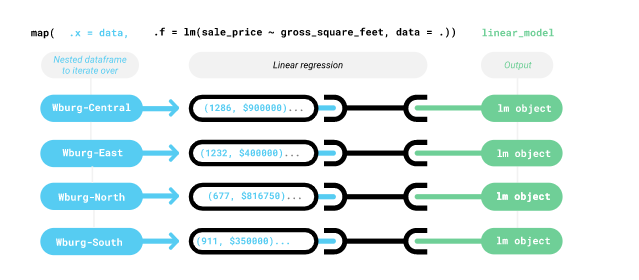

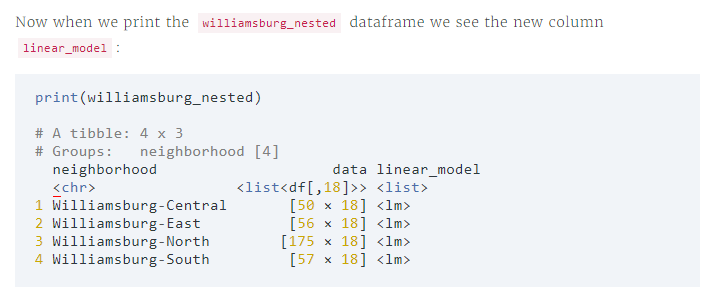

We now have linear regression results for all four Williamsburg neighborhoods! The new `linear_model` column is also a list-column like the `data` column. This `linear_model` variable is a list of lists, where each observation represents an `lm()` output. We can access the linear model lists in the same way that we looked at the nested dataframe above

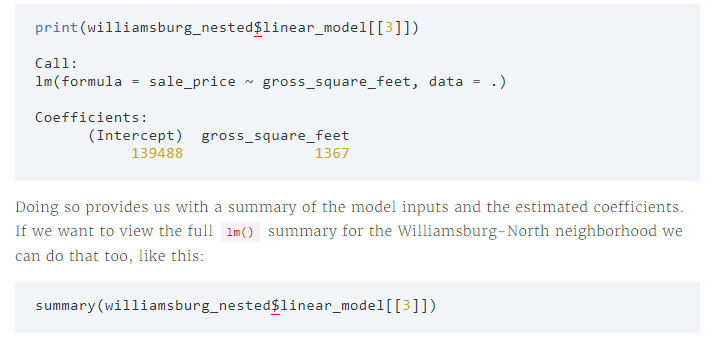

**Task**

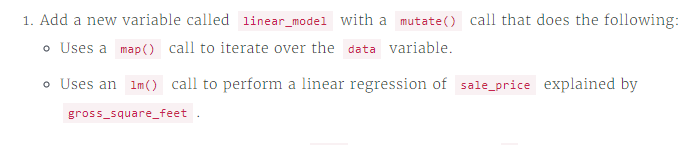

Remember that the data is passed to the `lm()` call using the dot (`.`). 

**Answer**

`library(purrr)`

`brooklyn_nested <- brooklyn_top_ten %>% 
  group_by(neighborhood) %>% 
  nest() %>% 
  mutate(linear_model = map(.x = data, 
                            .f = ~lm(sale_price ~ gross_square_feet, data = .)))`

As we have seen, list-columns are useful data structures because they enable us to iterate over each observation in a dataframe with `map()` and to apply a function like `lm()` or `tidy()`. But now that we have the list-column `tidy_coefficients` of tidied model summaries how do we access the data? Once again let's check out our results for the Madison neighborhood:

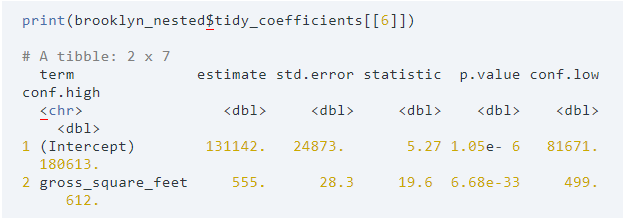

There is a lot of useful information above, and the output is more concise than if we had used `summary()` and `confint()` to view the same information. So how to we return the tidy summary information for all models into one place? We use the [`unnest()` function](https://tidyr.tidyverse.org/reference/nest.html) from the `tidyr` package on the `tidy_coefficients` variable. The `unnest()` function flattens a list-column variable in to a regular dataframe. This animation illustrates the data transformation:

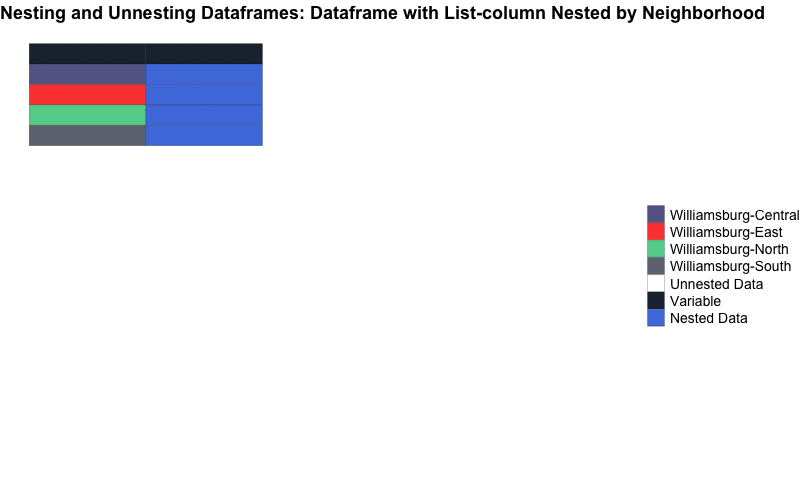

In [2]:
Image("unnest_animate_neighborhood (1).gif")

For our purposes, we need to provide two inputs to the `unnest()` function:

`library(tidyr)
unnest(data, cols)`

Where `data` is the dataframe with the data to unnest, and `cols` refers to the name of the columns to unnest. And as with other tidyverse functions, if we pass the dataframe in through a pipe operation (`%>%`), there is no need to specify the data argument.

Let's learn how to unnest our tidy model summaries for the `williamsburg_nested` dataframe. Here is the code to generate a new dataframe called `williamsburg_coefficients`:

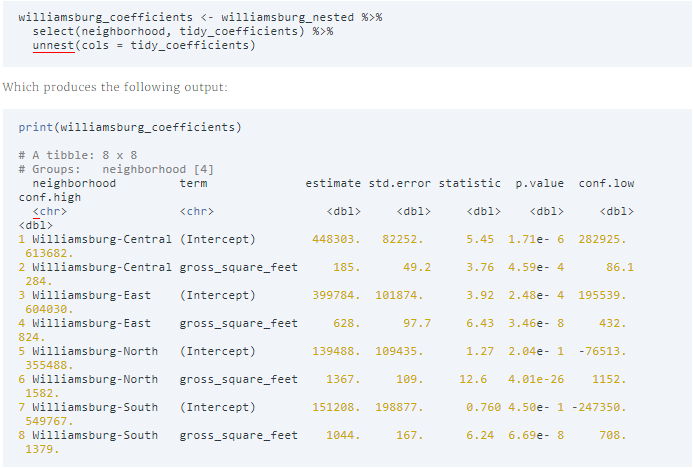

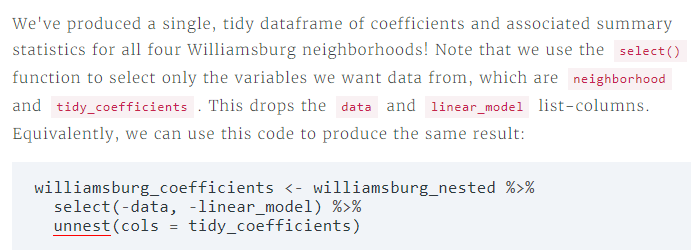

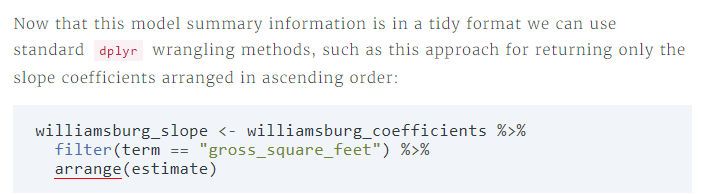

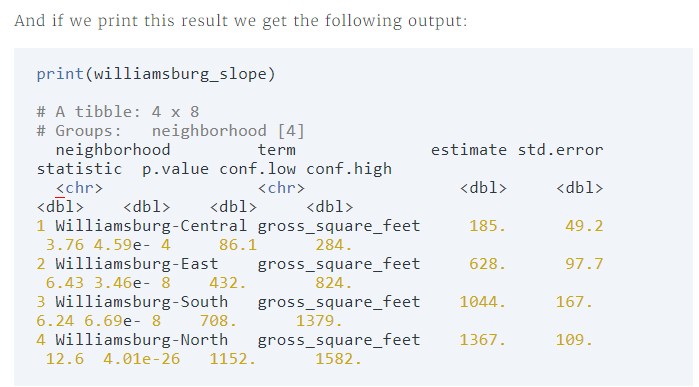

We can make the following statements about the data above:

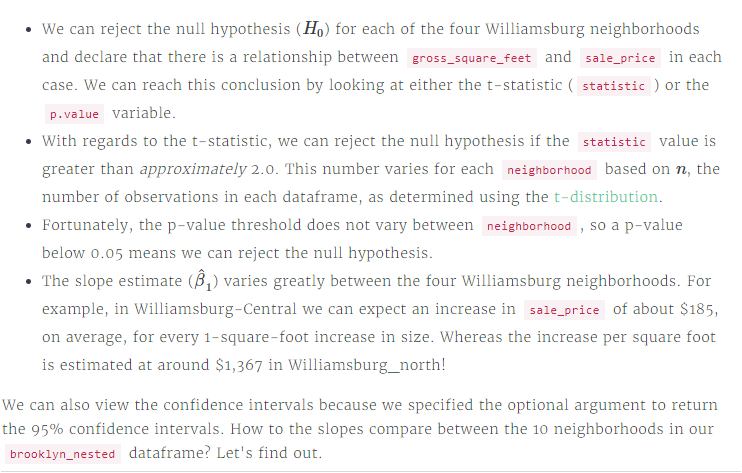

**Task**

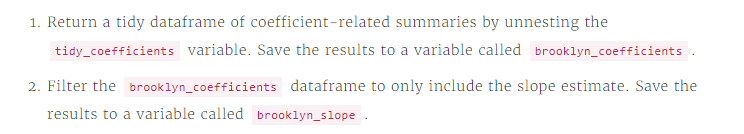

**Answer**

`brooklyn_coefficients <- brooklyn_nested %>% 
  select(neighborhood, tidy_coefficients) %>% 
  unnest(cols = tidy_coefficients)`

`brooklyn_slope <- brooklyn_coefficients %>%   
  filter(term == "gross_square_feet") %>% 
  arrange(estimate)`

Before we move on to generating tidy summary statistics with another `broom` function, let's reflect on the results of the above exercise where we generated a tidy summary of coefficients and associated values. Here are the results:

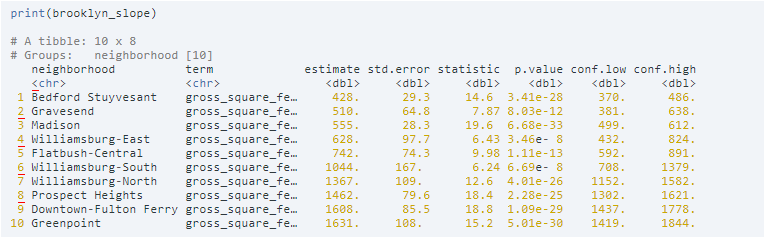

Like with the `williamsburg_condos` data, we see a wide range in slope estimates across the neighborhoods. Also, the large t-statistic values, and small p-values mean that there is a relationship between `gross_square_feet` and `sale_price` for each neighborhood.

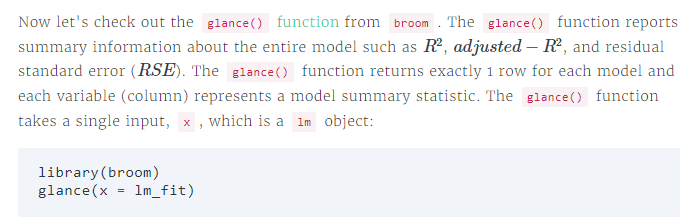

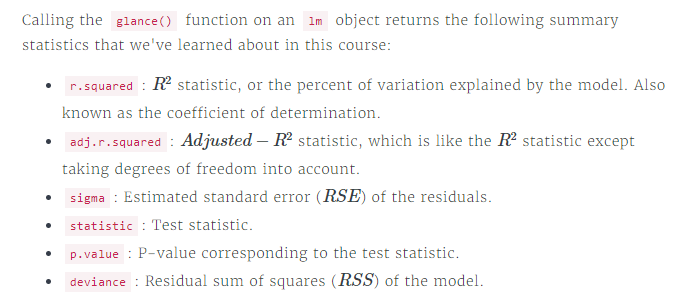

To view the summary statistics bulleted above we would have to call `summary()` and `deviance()` on the `lm` object:

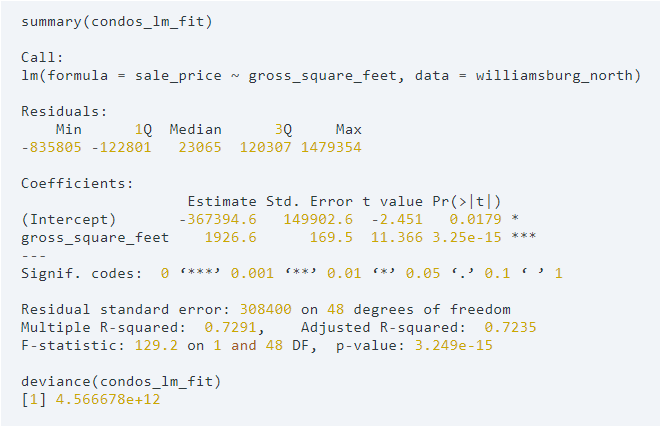

Once again we have to visually scan through a lot of information to obtain the value for each summary statistic and the information is difficult to access. Fortunately, the `glance()` function can help us in this situation by returning a single-row dataframe of key linear model summary statistics. 

Let's practice using this function by generating a new list-column of tidy summary statistics for each model, and then unnesting the results to a tidy dataframe of summary statistics.

This graphic illustrates the process of generating a tidy dataframe of regression summary statistics for each linear model object:

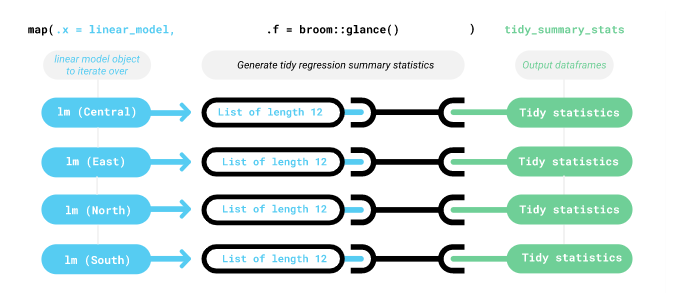

We won't review the coding steps required to generate the new list-column and then unnest the column to a tidy dataframe because the general approach is the same as what we completed in the previous exercises with the `tidy()` function from `broom`.

**Task**

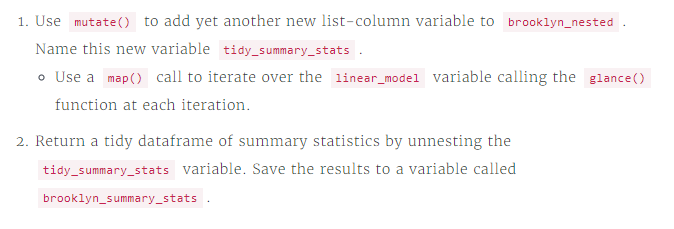

**Answer**

`brooklyn_nested <- brooklyn_top_ten %>% 
  group_by(neighborhood) %>% 
  nest() %>% 
  mutate(linear_model = map(.x = data, 
                            .f = ~lm(sale_price ~ gross_square_feet, 
                                     data = .))) %>%
  mutate(tidy_coefficients = map(.x = linear_model, 
                                 .f = tidy, 
                                 conf.int = TRUE)) %>% 
  mutate(tidy_summary_stats = map(.x = linear_model,
                                  .f = glance))`

`brooklyn_summary_stats <- brooklyn_nested %>% 
  select(neighborhood, tidy_summary_stats) %>% 
  unnest(cols = tidy_summary_stats)`

We will learn how to add regression statistics to each row in a dataframe, but first let's take a look at the results from the above exercise where we used the `glance()` function from `broom` to return a single row of summary statistics for our linear models. Here's the code and the output:

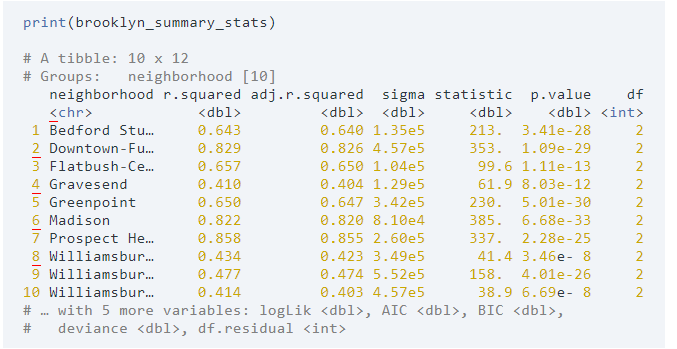

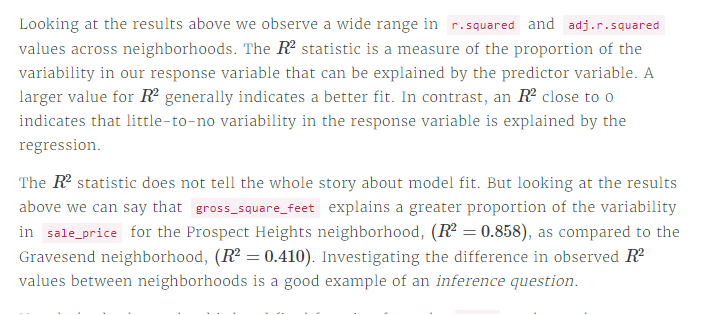

Now let's check out the third and final function from the `broom` package, the [`augment()` function](https://broom.tidymodels.org/).

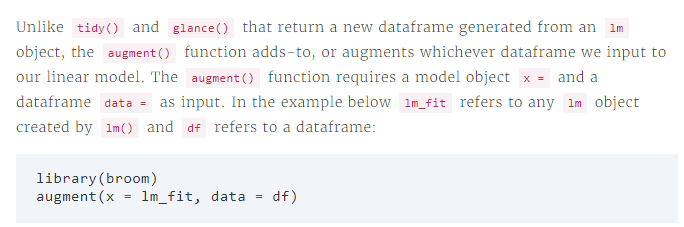

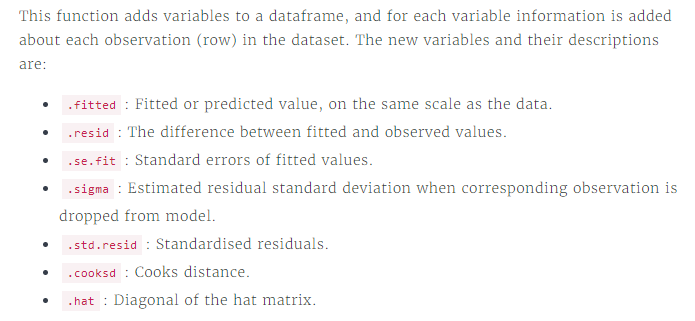

Some of the variables above describe information that we haven't learned about. Most relevant to us at this point in our learning journey is the predictions (`.fitted`) and the residuals (`.resid`) variables.

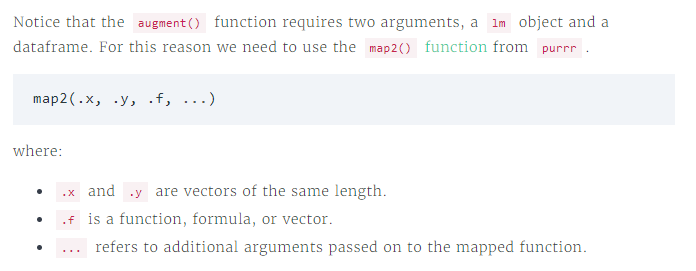

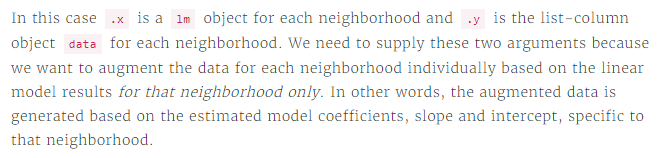

The code below shows how we can use `mutate()` and `map2()` to add yet another list column to the `brooklyn_nested` dataframe:

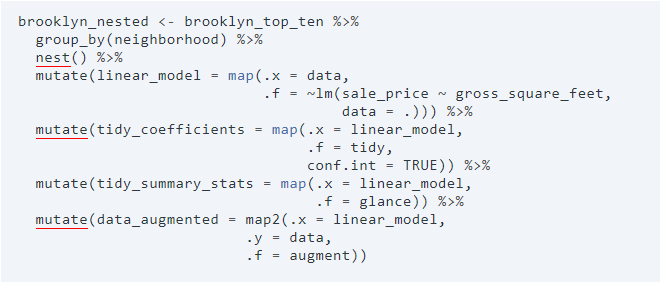

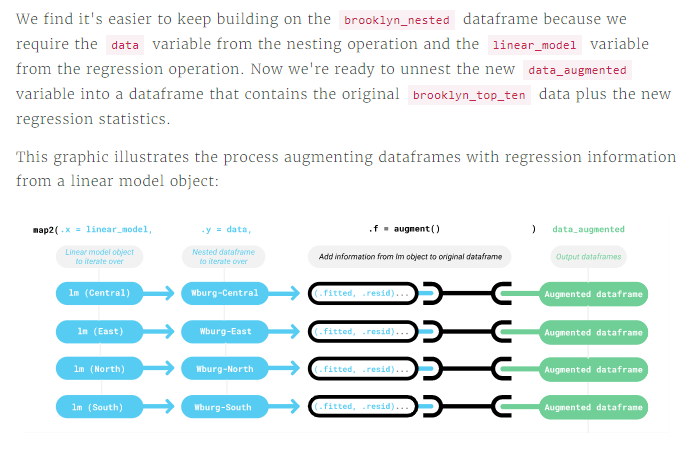

**Task**

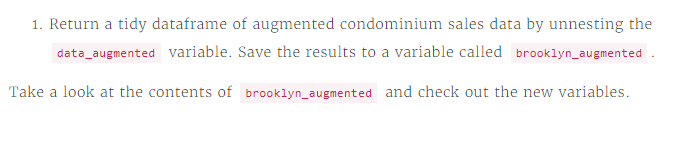

**Answer**

`brooklyn_nested <- brooklyn_top_ten %>% 
  group_by(neighborhood) %>% 
  nest() %>% 
  mutate(linear_model = map(.x = data, 
                            .f = ~lm(sale_price ~ gross_square_feet, 
                                     data = .))) %>%
  mutate(tidy_coefficients = map(.x = linear_model, 
                                 .f = tidy, 
                                 conf.int = TRUE)) %>% 
  mutate(tidy_summary_stats = map(.x = linear_model,
                                  .f = glance)) %>% 
  mutate(data_augmented = map2(.x = linear_model, 
                          .y = data, 
                          .f = augment))
brooklyn_augmented <- brooklyn_nested %>%
  select(neighborhood, data_augmented) %>% 
  unnest(data_augmented)`

In this file not only have we learned how to build and interpret a bivariate linear regression model, we've learned how to build and interpret many linear models at once! 

In this file we also learned how to generate tidy summaries of regression statistics, and we learned how to augment many dataframes at the same time with regression statistics like the predictions and the residuals. And when we have the residuals available we can plot them like this to look for unusual patterns:

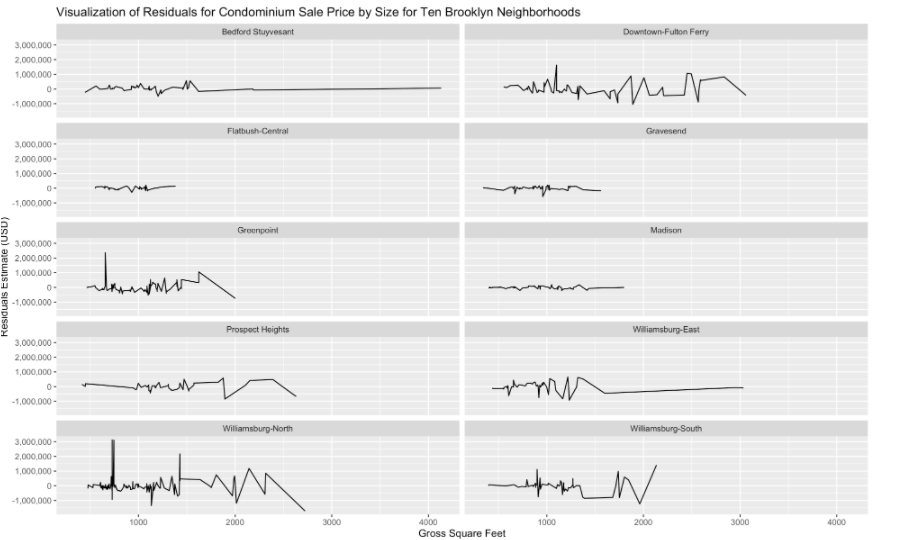

The three broom functions `tidy()`, `glance()` and `augment()` are detailed in [this vignette](https://cran.r-project.org/web/packages/broom/vignettes/broom.html). As we learned, the `broom` package works well with tidyverse tools, namely with functions from the `dplyr`, `tidyr` and `purrr` packages. And as we have seen in this file, `broom` becomes a much more powerful analysis tool because of it's compatibility with tidyverse tools. 

If we'd like to learn more about working with `broom` and `tidyverse` tools check out [this vignette](https://cran.r-project.org/web/packages/broom/vignettes/broom_and_dplyr.html). 

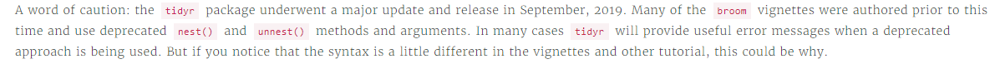

We did not cover multivartiate linear regression or using modeling results to make predictions in this file.